<a href="https://colab.research.google.com/github/uol-mediaprocessing/group-projects-group-photo/blob/master/dlib_face_recognition_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

alpha_feathering
check_points


In [8]:
#getting all the data
!wget -q  https://github.com/uol-mediaprocessing/group-projects-group-photo/raw/master/shape_predictor_68_face_landmarks.dat.bz2 -O shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2
!wget -q https://github.com/uol-mediaprocessing/group-projects-group-photo/raw/master/dlib_face_recognition_resnet_model_v1.dat.bz2
!bzip2 -d dlib_face_recognition_resnet_model_v1.dat.bz2
!ls -l

!wget https://github.com/wuhuikai/FaceSwap/raw/master/imgs/test6.jpg
!wget https://github.com/wuhuikai/FaceSwap/raw/master/imgs/test7.jpg

# initializing everything
!pip install cmake numpy opencv-python dlib imutils

import cv2
import numpy as np
import scipy.spatial as spatial
import logging


## 3D Transform
def bilinear_interpolate(img, coords):
    """ Interpolates over every image channel
    http://en.wikipedia.org/wiki/Bilinear_interpolationa
    :param img: max 3 channel image
    :param coords: 2 x _m_ array. 1st row = xcoords, 2nd row = ycoords
    :returns: array of interpolated pixels with same shape as coords
    """
    int_coords = np.int32(coords)
    x0, y0 = int_coords
    dx, dy = coords - int_coords

    # 4 Neighour pixels
    q11 = img[y0, x0]
    q21 = img[y0, x0 + 1]
    q12 = img[y0 + 1, x0]
    q22 = img[y0 + 1, x0 + 1]

    btm = q21.T * dx + q11.T * (1 - dx)
    top = q22.T * dx + q12.T * (1 - dx)
    inter_pixel = top * dy + btm * (1 - dy)

    return inter_pixel.T

def grid_coordinates(points):
    """ x,y grid coordinates within the ROI of supplied points
    :param points: points to generate grid coordinates
    :returns: array of (x, y) coordinates
    """
    xmin = np.min(points[:, 0])
    xmax = np.max(points[:, 0]) + 1
    ymin = np.min(points[:, 1])
    ymax = np.max(points[:, 1]) + 1

    return np.asarray([(x, y) for y in range(ymin, ymax)
                       for x in range(xmin, xmax)], np.uint32)


def process_warp(src_img, result_img, tri_affines, dst_points, delaunay):
    """
    Warp each triangle from the src_image only within the
    ROI of the destination image (points in dst_points).
    """
    roi_coords = grid_coordinates(dst_points)
    # indices to vertices. -1 if pixel is not in any triangle
    roi_tri_indices = delaunay.find_simplex(roi_coords)

    for simplex_index in range(len(delaunay.simplices)):
        coords = roi_coords[roi_tri_indices == simplex_index]
        num_coords = len(coords)
        out_coords = np.dot(tri_affines[simplex_index],
                            np.vstack((coords.T, np.ones(num_coords))))
        x, y = coords.T
        result_img[y, x] = bilinear_interpolate(src_img, out_coords)

    return None


def triangular_affine_matrices(vertices, src_points, dst_points):
    """
    Calculate the affine transformation matrix for each
    triangle (x,y) vertex from dst_points to src_points
    :param vertices: array of triplet indices to corners of triangle
    :param src_points: array of [x, y] points to landmarks for source image
    :param dst_points: array of [x, y] points to landmarks for destination image
    :returns: 2 x 3 affine matrix transformation for a triangle
    """
    ones = [1, 1, 1]
    for tri_indices in vertices:
        src_tri = np.vstack((src_points[tri_indices, :].T, ones))
        dst_tri = np.vstack((dst_points[tri_indices, :].T, ones))
        mat = np.dot(src_tri, np.linalg.inv(dst_tri))[:2, :]
        yield mat


def warp_image_3d(src_img, src_points, dst_points, dst_shape, dtype=np.uint8):
    rows, cols = dst_shape[:2]
    result_img = np.zeros((rows, cols, 3), dtype=dtype)

    delaunay = spatial.Delaunay(dst_points)
    tri_affines = np.asarray(list(triangular_affine_matrices(
        delaunay.simplices, src_points, dst_points)))

    process_warp(src_img, result_img, tri_affines, dst_points, delaunay)

    return result_img


## 2D Transform
def transformation_from_points(points1, points2):
    points1 = points1.astype(np.float64)
    points2 = points2.astype(np.float64)

    c1 = np.mean(points1, axis=0)
    c2 = np.mean(points2, axis=0)
    points1 -= c1
    points2 -= c2

    s1 = np.std(points1)
    s2 = np.std(points2)
    points1 /= s1
    points2 /= s2

    U, S, Vt = np.linalg.svd(np.dot(points1.T, points2))
    R = (np.dot(U, Vt)).T

    return np.vstack([np.hstack([s2 / s1 * R,
                                (c2.T - np.dot(s2 / s1 * R, c1.T))[:, np.newaxis]]),
                      np.array([[0., 0., 1.]])])


def warp_image_2d(im, M, dshape):
    output_im = np.zeros(dshape, dtype=im.dtype)
    cv2.warpAffine(im,
                   M[:2],
                   (dshape[1], dshape[0]),
                   dst=output_im,
                   borderMode=cv2.BORDER_TRANSPARENT,
                   flags=cv2.WARP_INVERSE_MAP)

    return output_im


## Generate Mask
def mask_from_points(size, points,erode_flag=1):
    radius = 10  # kernel size
    kernel = np.ones((radius, radius), np.uint8)

    mask = np.zeros(size, np.uint8)
    cv2.fillConvexPoly(mask, cv2.convexHull(points), 255)
    print('mask')
    cv2_imshow(mask)
    if erode_flag:
        mask = cv2.erode(mask, kernel,iterations=1)
        print('eroded mask')
        cv2_imshow(mask)

    return mask


## Color Correction
def correct_colours(im1, im2, landmarks1):
    COLOUR_CORRECT_BLUR_FRAC = 0.75
    LEFT_EYE_POINTS = list(range(42, 48))
    RIGHT_EYE_POINTS = list(range(36, 42))
    print('correct_colours: \n')
    blur_amount = COLOUR_CORRECT_BLUR_FRAC * np.linalg.norm(
                              np.mean(landmarks1[LEFT_EYE_POINTS], axis=0) -
                              np.mean(landmarks1[RIGHT_EYE_POINTS], axis=0))
    blur_amount = int(blur_amount)
    
    # kernel doesn't have center.
    if blur_amount % 2 == 0:
        blur_amount += 1
    
    print('blured')
    im1_blur = cv2.GaussianBlur(im1, (blur_amount, blur_amount), 0)
    cv2_imshow(im1_blur)
    im2_blur = cv2.GaussianBlur(im2, (blur_amount, blur_amount), 0)
    cv2_imshow(im2_blur)

    print('as int')
    # Avoid divide-by-zero errors.
    im2_blur = im2_blur.astype(int)
    cv2_imshow(im2_blur)
    im2_blur += 128*(im2_blur <= 1)
    cv2_imshow(im2_blur)

    print('results')
    result = im2.astype(np.float64) * im1_blur.astype(np.float64) / im2_blur.astype(np.float64)
    print('result as float64')
    cv2_imshow(result)
    result = np.clip(result, 0, 255).astype(np.uint8)

    return result


## Copy-and-paste
def apply_mask(img, mask):
    """ Apply mask to supplied image
    :param img: max 3 channel image
    :param mask: [0-255] values in mask
    :returns: new image with mask applied
    """
    masked_img=cv2.bitwise_and(img,img,mask=mask)

    return masked_img

# Can be optimized by giving the face instead of the whole picture
def select_face(im, a, r=10):
    img_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    faces = detector(img_gray, 0)

    if len(faces) == 0:
      print('Detect 0 Faces !!!')
      
    if len(faces) == 1:
      bbox = faces[0]
    else:
      bbox = []
      im_copy = im.copy()
      for face in faces:
          # draw the face bounding box
          cv2.rectangle(im_copy, (face.left(), face.top()), (face.right(), face.bottom()), (0, 0, 255), 1)
      #bbox = bbox[0]

    # Always takes first face found in picture!!
    landmarks = predictor(img_gray, faces[a])
    points = np.asarray(list([p.x, p.y] for p in landmarks.parts()), dtype=np.int)

    im_w, im_h = im.shape[:2]
    left, top = np.min(points, 0)
    right, bottom = np.max(points, 0)

    x, y = max(0, left-r), max(0, top-r)
    w, h = min(right+r, im_h)-x, min(bottom+r, im_w)-y

    return points - np.asarray([[x, y]]), (x, y, w, h), im[y:y+h, x:x+w]

bzip2: Output file shape_predictor_68_face_landmarks.dat already exists.
bzip2: Output file dlib_face_recognition_resnet_model_v1.dat already exists.
total 236964
-rw-r--r-- 1 root root 22466066 Dec  5 12:51 dlib_face_recognition_resnet_model_v1.dat
-rw-r--r-- 1 root root 21428389 Dec  5 12:59 dlib_face_recognition_resnet_model_v1.dat.bz2
-rw-r--r-- 1 root root 21428389 Dec  5 13:04 dlib_face_recognition_resnet_model_v1.dat.bz2.1
-rw-r--r-- 1 root root  2922692 Dec  5 12:51 IMG_20191112_110956.jpg
-rw-r--r-- 1 root root  2922692 Dec  5 12:54 IMG_20191112_110956.jpg.1
-rw-r--r-- 1 root root  2922692 Dec  5 13:00 IMG_20191112_110956.jpg.2
-rw-r--r-- 1 root root  2922692 Dec  5 13:03 IMG_20191112_110956.jpg.3
drwxr-xr-x 1 root root     4096 Nov 27 22:38 sample_data
-rw-r--r-- 1 root root 99693937 Dec  5 12:51 shape_predictor_68_face_landmarks.dat
-rw-r--r-- 1 root root 64040097 Dec  5 13:04 shape_predictor_68_face_landmarks.dat.bz2
-rw-r--r-- 1 root root   462025 Dec  5 12:51 test6.jpg
-r

In [2]:
import cv2
import dlib
from google.colab.patches import cv2_imshow
!ls
# set up the 68 point facial landmark detector
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
facerec = dlib.face_recognition_model_v1("dlib_face_recognition_resnet_model_v1.dat")

dlib_face_recognition_resnet_model_v1.dat  test6.jpg
sample_data				   test7.jpg
shape_predictor_68_face_landmarks.dat


In [14]:
# https://github.com/davisking/dlib/blob/master/python_examples/face_recognition.py

new_img = dlib.load_rgb_image('IMG_20191112_110956.jpg')
dets = detector(new_img, 1)

for k, d in enumerate(dets):
        print("Detection {}: Left: {} Top: {} Right: {} Bottom: {}".format(
            k, d.left(), d.top(), d.right(), d.bottom()))
        # Get the landmarks/parts for the face in box d.
        shape = predictor(new_img, d)
        face_descriptor = facerec.compute_face_descriptor(new_img, shape)
        print(face_descriptor)

Detection 0: Left: 1521 Top: 1481 Right: 1707 Bottom: 1666
-0.078222
0.0915518
-0.0550714
-0.0722403
-0.0996901
0.071359
-0.0138252
-0.0426952
0.240636
-0.0571348
0.218051
0.033734
-0.198327
0.0069611
-0.00110801
0.0991196
-0.166982
-0.0846232
-0.0426739
0.00574457
0.0346156
0.0155645
0.0304691
0.11359
-0.12091
-0.293977
-0.089877
-0.12715
0.0994116
-0.164087
-0.0117407
0.0527103
-0.138631
-0.00999044
-0.0619015
0.0457294
-0.0496591
-0.128958
0.218484
0.0381086
-0.187765
0.00156485
-0.00653553
0.297901
0.126067
-0.0614023
0.0859483
-0.0947737
0.202904
-0.268573
0.100817
0.11972
0.143946
0.0745772
0.00800714
-0.0713237
0.0209912
0.150413
-0.254271
0.134623
0.115255
0.0446671
-0.00509911
-0.0578311
0.135667
0.164563
-0.111782
-0.138948
0.0473332
-0.158982
-0.0577396
0.126964
-0.106915
-0.286916
-0.208815
0.0923432
0.35131
0.192452
-0.0843509
0.0221358
-0.0794322
-0.0993468
0.0465627
0.0840456
-0.0631924
-0.0190435
-0.0986353
0.127519
0.260689
-0.0497955
0.0119222
0.271112
0.0526133
0.003

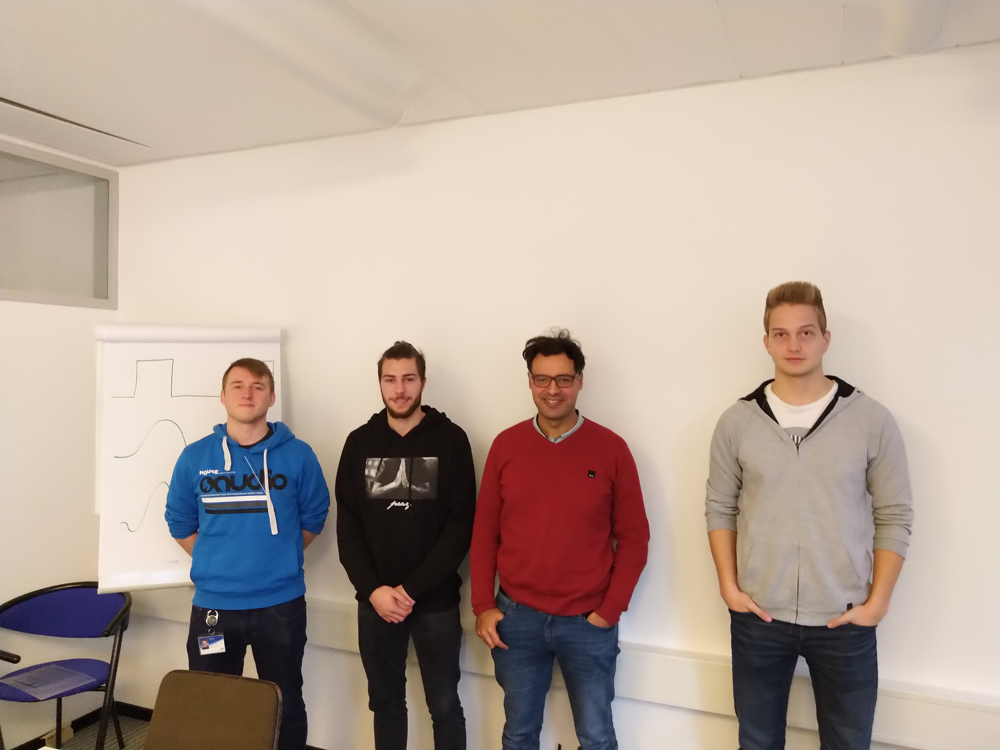

(1523, 1494, 188, 189)
mask


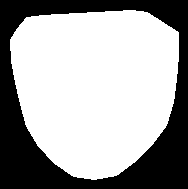

eroded mask


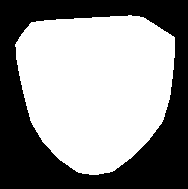

correct_colours: 

blured


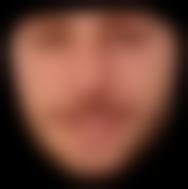

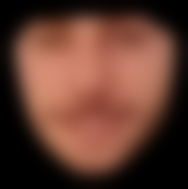

as int


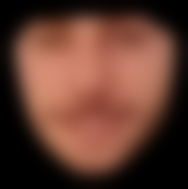

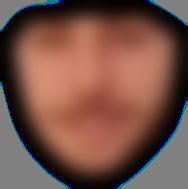

results
result as float64


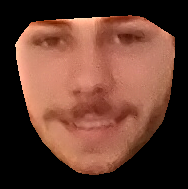

mask


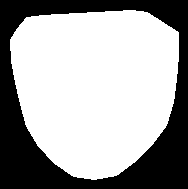

eroded mask


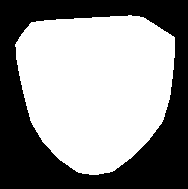

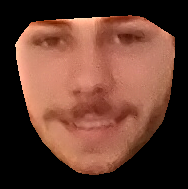

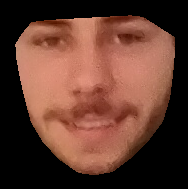

correct_colours: 

blured


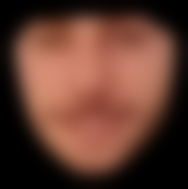

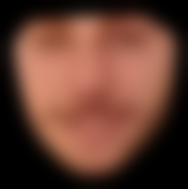

as int


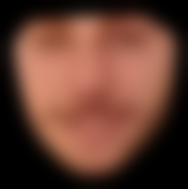

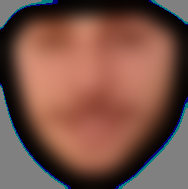

results
result as float64


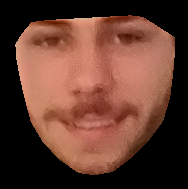

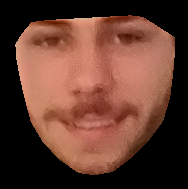

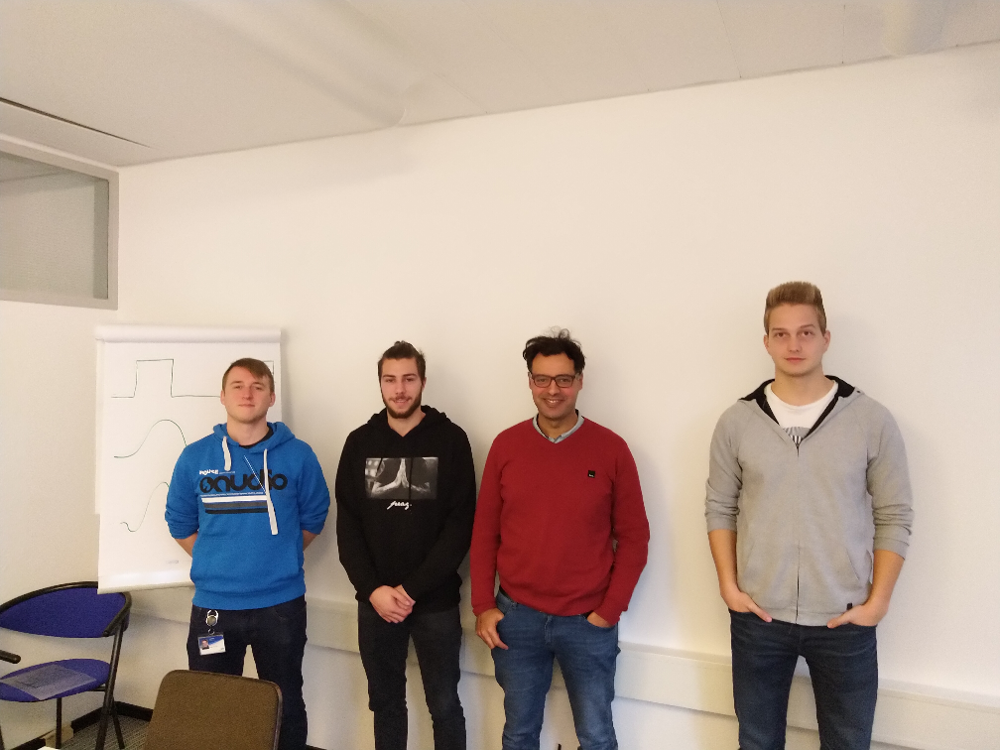

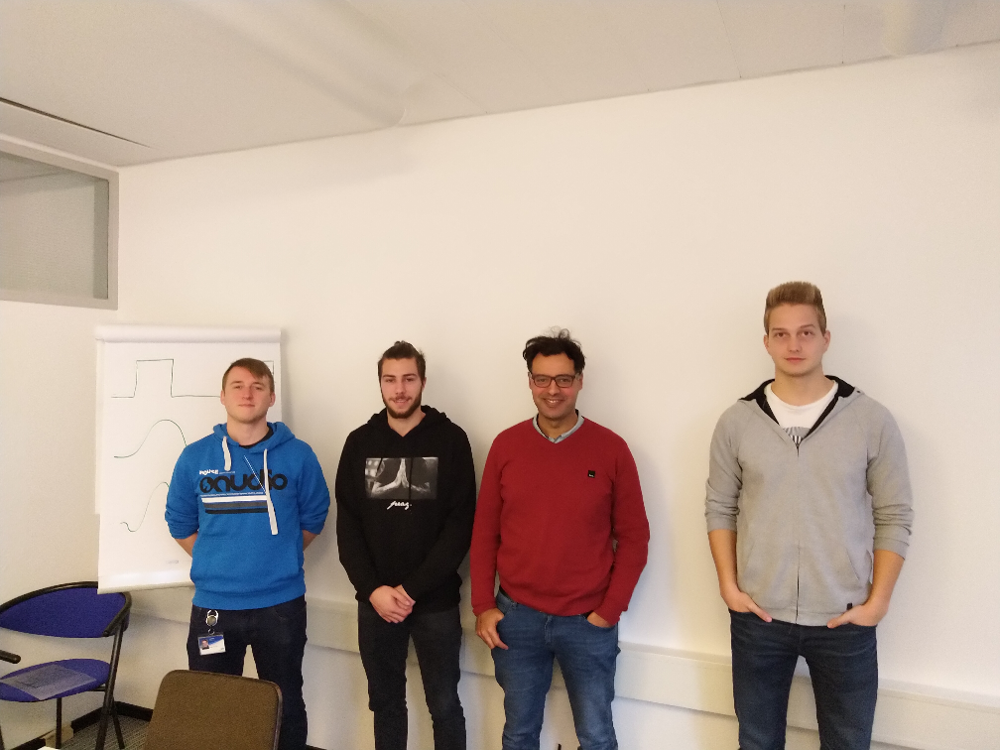

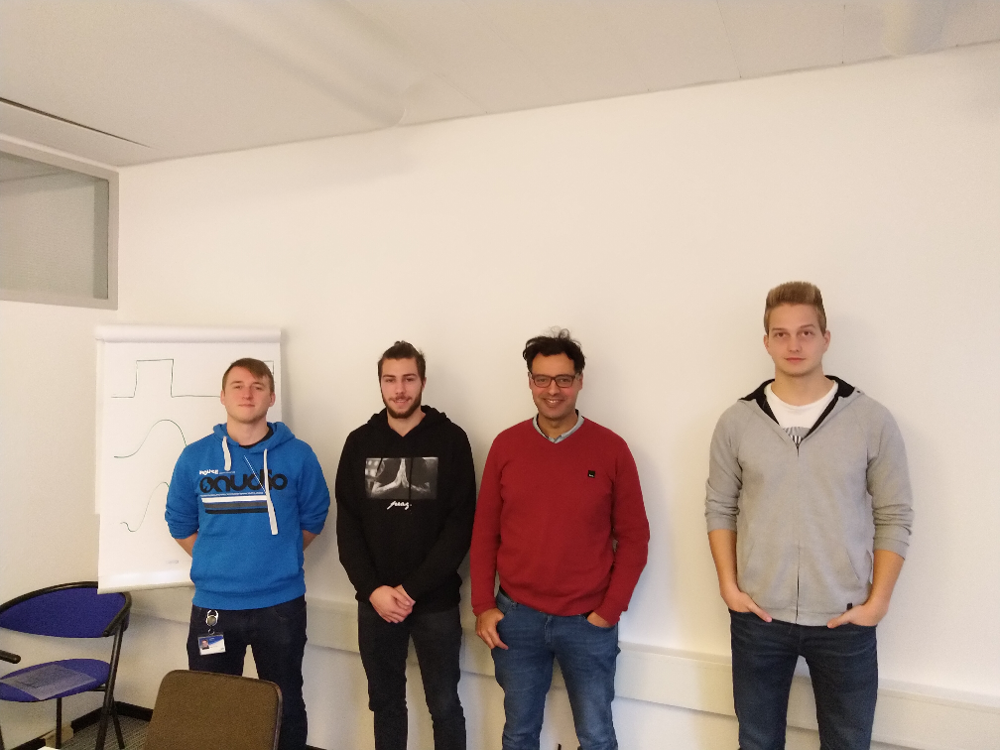

TypeError: ignored

In [11]:
# Read images
!wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-group-photo/master/pictures/group_1/IMG_20191112_110956.jpg
src_img = cv2.imread('IMG_20191112_110956.jpg', 1)
dst_img = cv2.imread('IMG_20191112_110956.jpg', 1)

def resize(img, scale):
  h, w, c = img.shape
  img_resized = cv2.resize(img,(int(w/scale),int(h/scale)))
  return img_resized

cv2_imshow(src_img)

# Select src face
src_points, src_shape, src_face = select_face(src_img,0)
print(src_shape)
# Select dst face
dst_points, dst_shape, dst_face = select_face(dst_img,0)

h, w = dst_face.shape[:2]

### Warp Image
#if not args.warp_2d:
    ## 3d warp
  #   warped_src_face = warp_image_3d(src_face, src_points[:48], dst_points[:48], (h, w))
#else:
  ## 2d warp

src_mask = mask_from_points(src_face.shape[:2], src_points)
src_face = apply_mask(src_face, src_mask)

# Correct Color for 2d warp
warped_dst_img = warp_image_3d(dst_face, dst_points[:48], src_points[:48], src_face.shape[:2])
src_face = correct_colours(warped_dst_img, src_face, src_points)

# Warp
warped_src_face = warp_image_2d(src_face, transformation_from_points(dst_points, src_points), (h, w, 3))

## Mask for blending
mask = mask_from_points((h, w), dst_points)
mask_src = np.mean(warped_src_face, axis=2) > 0
mask = np.asarray(mask*mask_src, dtype=np.uint8)

## Correct color
warped_src_face = apply_mask(warped_src_face, mask)
cv2_imshow(warped_src_face)
dst_face_masked = apply_mask(dst_face, mask)
cv2_imshow(dst_face_masked)
warped_src_face = correct_colours(dst_face_masked, warped_src_face, dst_points)
cv2_imshow(warped_src_face)

## Shrink the mask
kernel = np.ones((10, 10), np.uint8)
mask = cv2.erode(mask, kernel, iterations=1)

##Poisson Blending
r = cv2.boundingRect(mask)
center = ((r[0] + int(r[2] / 2), r[1] + int(r[3] / 2)))
output = cv2.seamlessClone(warped_src_face, dst_face, mask, center, cv2.NORMAL_CLONE)

x, y, w, h = dst_shape
dst_img_cp = dst_img.copy()
dst_img_cp[y:y+h, x:x+w] = output
output = dst_img_cp

##For debug
cv2_imshow(resize(src_img,4))
cv2_imshow(resize(dst_img,4))
cv2_imshow(resize(output,4))